## Carga y preparación de datos

In [1]:
import pandas as pd
import json
import glob

# 1. Buscar JSONs traducidos en la misma carpeta

json_files = glob.glob("*_traducidas.json")

def cargar_json_lyrics(filename):
    year = int(filename.split("_")[0])
    popularity = "unpopular" if "unpopus" in filename else "popular"
    
    with open(filename, "r", encoding="utf-8") as f:
        data = json.load(f)
    
    letras = []
    for lang in data.keys():  # Puede ser 'en' o 'es'
        for entry in data[lang]:
            letras.append({
                "translated": entry["translated"],
                "year_query": year,
                "popularity": popularity,
                "lang": lang
            })
    return pd.DataFrame(letras)


# 3. Cargar todos los archivos

dfs = [cargar_json_lyrics(file) for file in json_files]
df_all_lyrics = pd.concat(dfs, ignore_index=True)

print(f"Total canciones disponibles: {df_all_lyrics.shape[0]}")
print(df_all_lyrics.head())


Total canciones disponibles: 2400
                                          translated  year_query popularity  \
0  thought i'd end up with sean\nbut he wasn't a ...        2018    popular   
1  WO-OH, OH-OH\n\ndance as if it were the last t...        2018    popular   
2  lately, i've been, i've been thinking\ni want ...        2018    popular   
3  found you when your heart was broke\ni filled ...        2018    popular   
4  d.a. got that dope!\n\n\nice water, turned atl...        2018    popular   

  lang  
0   en  
1   en  
2   en  
3   en  
4   en  


## Limpieza de texto

In [3]:
import re

# Diccionario de contracciones comunes
contracciones = {
    "can't": "cannot", "won't": "will not", "n't": " not",
    "'re": " are", "'s": " is", "'d": " would", "'ll": " will",
    "'t": " not", "'ve": " have", "'m": " am"
}

# Función para reemplazar contracciones
def expandir_contracciones(texto):
    for contra, exp in contracciones.items():
        texto = re.sub(contra, exp, texto)
    return texto

def limpiar_texto(texto):
    if pd.isna(texto):
        return ""
    texto = texto.lower()
    texto = expandir_contracciones(texto)  # <-- nuevo paso
    texto = re.sub(r"[^a-zA-Z\s]", "", texto)  # Eliminar símbolos
    texto = re.sub(r"\s+", " ", texto)
    return texto.strip()

df_all_lyrics["cleaned_text"] = df_all_lyrics["translated"].apply(limpiar_texto)

In [4]:
df_all_lyrics

,translated,year_query,popularity,lang,cleaned_text
0,thought i'd end up with sean\nbut he wasn't a ...,2018,popular,en,thought i would end up with sean but he was no...
1,"WO-OH, OH-OH\n\ndance as if it were the last t...",2018,popular,en,wooh ohoh dance as if it were the last time an...
2,"lately, i've been, i've been thinking\ni want ...",2018,popular,en,lately i have been i have been thinking i want...
3,found you when your heart was broke\ni filled ...,2018,popular,en,found you when your heart was broke i filled y...
4,"d.a. got that dope!\n\n\nice water, turned atl...",2018,popular,en,da got that dope ice water turned atlantic fre...
...,...,...,...,...,...
2395,When I want\nBe your shadow\nIt is difficult t...,2025,unpopular,es,when i want be your shadow it is difficult to ...
2396,"Yeah\nKhea Young Flex, Eh\nUH-OH\neh, huh, h\n...",2025,unpopular,es,yeah khea young flex eh uhoh eh huh h mommy i ...
2397,"Prepare, that now and the time\nof the powerfu...",2025,unpopular,pt,prepare that now and the time of the powerful ...
2398,"HAKM, Motherfuck\nHAKM, Motherfuck\n\nmm, yeah...",2025,unpopular,nl,hakm motherfuck hakm motherfuck mm yeah people...


## Filtrar sustantivos y adjetivos

In [6]:
import nltk
from nltk import word_tokenize, pos_tag

# Ejecuta una sola vez si no lo has hecho:
#nltk.download("punkt")
#nltk.download("averaged_perceptron_tagger_eng")

# ------------------------------
# 1. Función para extraer solo sustantivos
# ------------------------------

def extraer_sustantivos_adjetivos(texto):
    tokens = nltk.word_tokenize(texto)
    tags = nltk.pos_tag(tokens, lang="eng")
    palabras = [word for word, tag in tags if tag.startswith("NN") or tag.startswith("JJ")]
    return " ".join(palabras)


# ------------------------------
# 2. Aplicar al DataFrame
# ------------------------------

df_all_lyrics["filtered_text"] = df_all_lyrics["cleaned_text"].apply(extraer_sustantivos_adjetivos)


df_all_lyrics[["cleaned_text", "filtered_text"]].head()


,cleaned_text,filtered_text
0,thought i would end up with sean but he was no...,thought i sean match songs ricky listen laugh ...
1,wooh ohoh dance as if it were the last time an...,wooh ohoh dance last time little step i soft b...
2,lately i have been i have been thinking i want...,i i i happier i happier morning cold light day...
3,found you when your heart was broke i filled y...,heart cup close close i afraid own i i knees f...
4,da got that dope ice water turned atlantic fre...,da dope ice water atlantic freeze night crawli...


## Sentiment Analysis

In [8]:
#import nltk
#nltk.download('vader_lexicon')

In [9]:
from nltk.sentiment import SentimentIntensityAnalyzer

sia = SentimentIntensityAnalyzer()

def analizar_sentimiento(texto):
    if pd.isna(texto) or texto.strip() == "":
        return {"polarity": 0.0, "sentiment": "neutral"}
    
    scores = sia.polarity_scores(texto)
    polarity = scores["compound"]
    
    if polarity >= 0.05:
        sentiment = "positive"
    elif polarity <= -0.05:
        sentiment = "negative"
    else:
        sentiment = "neutral"
        
    return {"polarity": polarity, "sentiment": sentiment}


sentiment_results = df_all_lyrics["filtered_text"].apply(analizar_sentimiento)

# Extraer polarity y sentiment a nuevas columnas
df_all_lyrics["polarity"] = sentiment_results.apply(lambda x: x["polarity"]) #siendo -1 = muy negativo y 1 = muy positivo
df_all_lyrics["sentiment"] = sentiment_results.apply(lambda x: x["sentiment"])

print(df_all_lyrics[[ "cleaned_text", "polarity", "sentiment"]].head(10))


                                        cleaned_text  polarity sentiment
0  thought i would end up with sean but he was no...    0.9988  positive
1  wooh ohoh dance as if it were the last time an...   -0.3182  negative
2  lately i have been i have been thinking i want...    0.9901  positive
3  found you when your heart was broke i filled y...    0.9545  positive
4  da got that dope ice water turned atlantic fre...   -0.9946  negative
5  astro yeah sun is down freezin cold that is ho...    0.9694  positive
6  ayy ayy ayy ayy ooh ooh ooh ooh ohh ooh ayy ay...   -0.4588  negative
7  ohoh ooh ooh lil pump maluma baby oh wooohoh o...    0.9803  positive
8  no no no no nono no no no no no no no no no no...    0.9468  positive
9  oh she is sweet but a psycho a little bit psyc...    0.5868  positive


## Topic Modeling

In [14]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation


df_lda = df_all_lyrics.copy()

# Vectorizar las letras
vectorizer = CountVectorizer(
    max_df=0.95, 
    min_df=2, 
    stop_words="english"  # Usamos stopwords automáticas de inglés
)
# X = vectorizer.fit_transform(df_lda["cleaned_text"])
X = vectorizer.fit_transform(df_lda["filtered_text"]) # solo con sustantivos y adjetivos

# ------------------------------
# 2. Crear el modelo LDA
# ------------------------------

n_topics = 5  # Número de temas que quieres detectar (ajustable)

lda_model = LatentDirichletAllocation(
    n_components=n_topics, 
    random_state=42
)
lda_model.fit(X)

# ------------------------------
# 3. Ver los términos principales por tema
# ------------------------------

def mostrar_top_palabras(model, feature_names, n_top_words=10):
    for topic_idx, topic in enumerate(model.components_):
        print(f"🔹 Topic {topic_idx}:")
        print(" ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]))
        print()

# Mostrar palabras más importantes de cada tema
print("Main topics found:")
mostrar_top_palabras(lda_model, vectorizer.get_feature_names_out())

# ------------------------------
# 4. Asignar el tema principal a cada letra
# ------------------------------

# Obtener distribución de temas por documento
topic_distribution = lda_model.transform(X)
assigned_topics = topic_distribution.argmax(axis=1)

# Asignar al DataFrame original
df_lda["topic"] = assigned_topics

# Unimos el resultado de vuelta a df_all_lyrics
df_all_lyrics.loc[df_lda.index, "topic"] = df_lda["topic"]

print("Main topic assigned to each song.")
print(df_all_lyrics[["translated", "sentiment", "topic"]].head(5))


Main topics found:
🔹 Topic 0:
oh yeah hey tonight ay high baby na night taste

🔹 Topic 1:
baby yeah time night real ah mind pa world hard

🔹 Topic 2:
love bad good baby oh doh night ooh whoa heart

🔹 Topic 3:
yeah bitch shit money nigga man niggas ayy fuck uh

🔹 Topic 4:
time way cause baby day life love heart girl mind

Main topic assigned to each song.
                                          translated sentiment  topic
0  thought i'd end up with sean\nbut he wasn't a ...  positive    0.0
1  WO-OH, OH-OH\n\ndance as if it were the last t...  negative    0.0
2  lately, i've been, i've been thinking\ni want ...  positive    4.0
3  found you when your heart was broke\ni filled ...  positive    4.0
4  d.a. got that dope!\n\n\nice water, turned atl...  negative    1.0


## Análisis Temporal y Popularidad vs Letras

In [15]:
paleta = ["#7C01B5", "#F2BEFC", "#CA9CE1", "#F3E0EC", "#9EE493", "#A7E69D", "#648767", "#B5CA8D", "#6096BA"]
import matplotlib.pyplot as plt

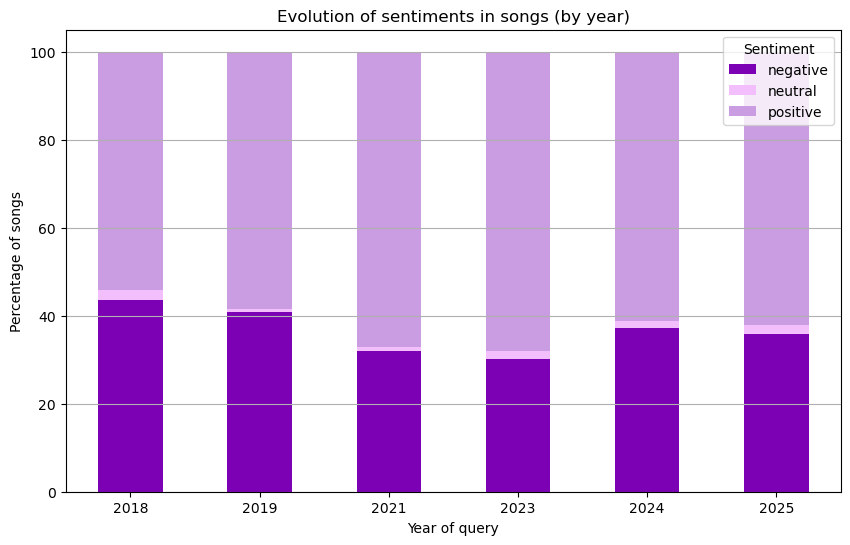

In [23]:
## Evolution of sentiments (by year)
sentiment_by_year = df_all_lyrics.groupby(["year_query", "sentiment"]).size().unstack(fill_value=0)
sentiment_by_year_percent = sentiment_by_year.div(sentiment_by_year.sum(axis=1), axis=0) * 100

sentiment_by_year_percent.plot(kind="bar", stacked=True, figsize=(10,6), color=paleta)
plt.title("Evolution of sentiments in songs (by year)")
plt.ylabel("Percentage of songs")
plt.xlabel("Year of query")
plt.xticks(rotation=0)
plt.legend(title="Sentiment")
plt.grid(axis="y")
plt.show()

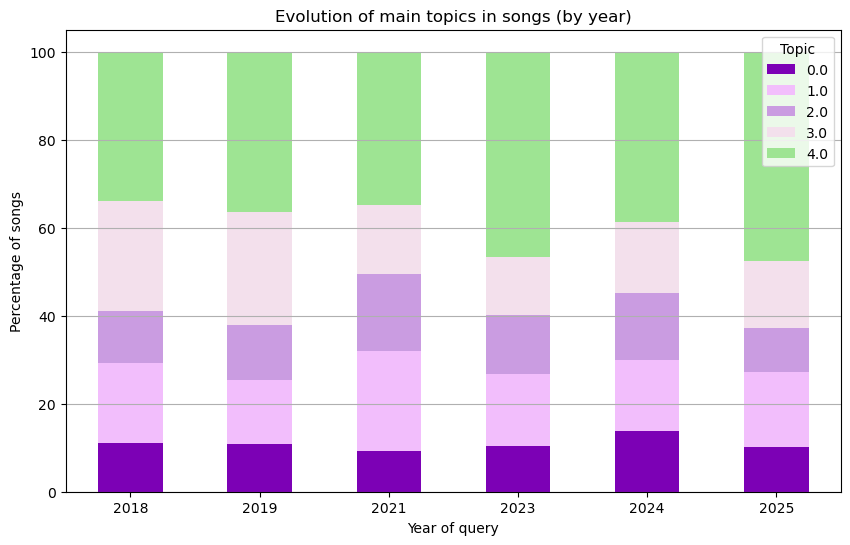

In [25]:
## Evolution of main topics (by year)
topic_by_year = df_all_lyrics.groupby(["year_query", "topic"]).size().unstack(fill_value=0)
topic_by_year_percent = topic_by_year.div(topic_by_year.sum(axis=1), axis=0) * 100

topic_by_year_percent.plot(kind="bar", stacked=True, figsize=(10,6), color=paleta)
plt.title("Evolution of main topics in songs (by year)")
plt.ylabel("Percentage of songs")
plt.xlabel("Year of query")
plt.xticks(rotation=0)
plt.legend(title="Topic")
plt.grid(axis="y")
plt.show()

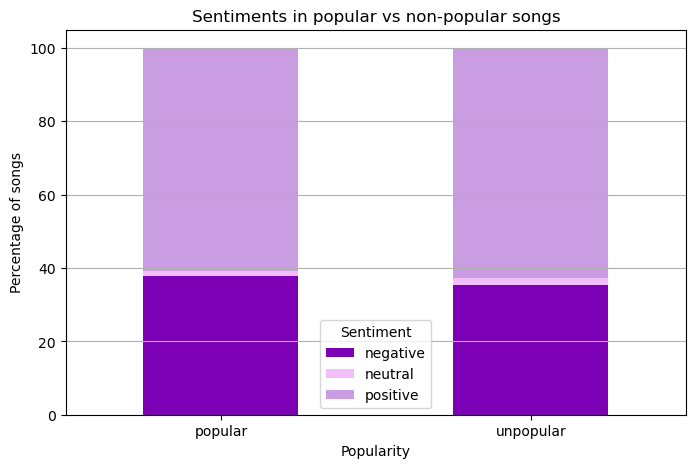

In [27]:
## Popular vs non-popular song sentiments
sentiment_by_popularity = df_all_lyrics.groupby(["popularity", "sentiment"]).size().unstack(fill_value=0)
sentiment_by_popularity_percent = sentiment_by_popularity.div(sentiment_by_popularity.sum(axis=1), axis=0) * 100

sentiment_by_popularity_percent.plot(kind="bar", stacked=True, figsize=(8,5), color=paleta)
plt.title("Sentiments in popular vs non-popular songs")
plt.ylabel("Percentage of songs")
plt.xlabel("Popularity")
plt.xticks(rotation=0)
plt.legend(title="Sentiment")
plt.grid(axis="y")
plt.show()

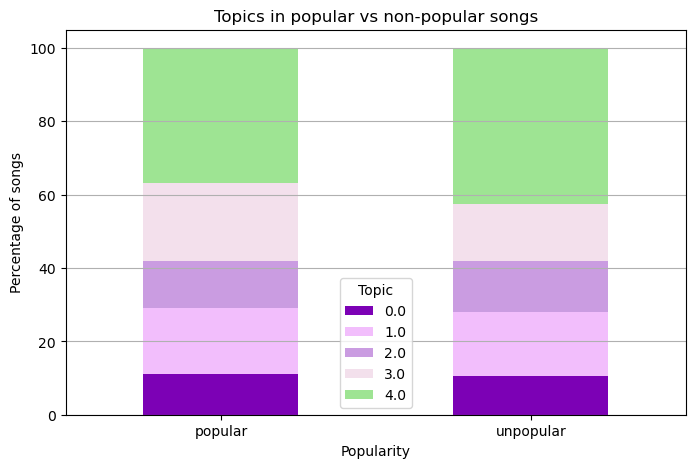

In [29]:
## Popular vs non-popular song topics
topic_by_popularity = df_all_lyrics.groupby(["popularity", "topic"]).size().unstack(fill_value=0)
topic_by_popularity_percent = topic_by_popularity.div(topic_by_popularity.sum(axis=1), axis=0) * 100

topic_by_popularity_percent.plot(kind="bar", stacked=True, figsize=(8,5), color=paleta)
plt.title("Topics in popular vs non-popular songs")
plt.ylabel("Percentage of songs")
plt.xlabel("Popularity")
plt.xticks(rotation=0)
plt.legend(title="Topic")
plt.grid(axis="y")
plt.show()

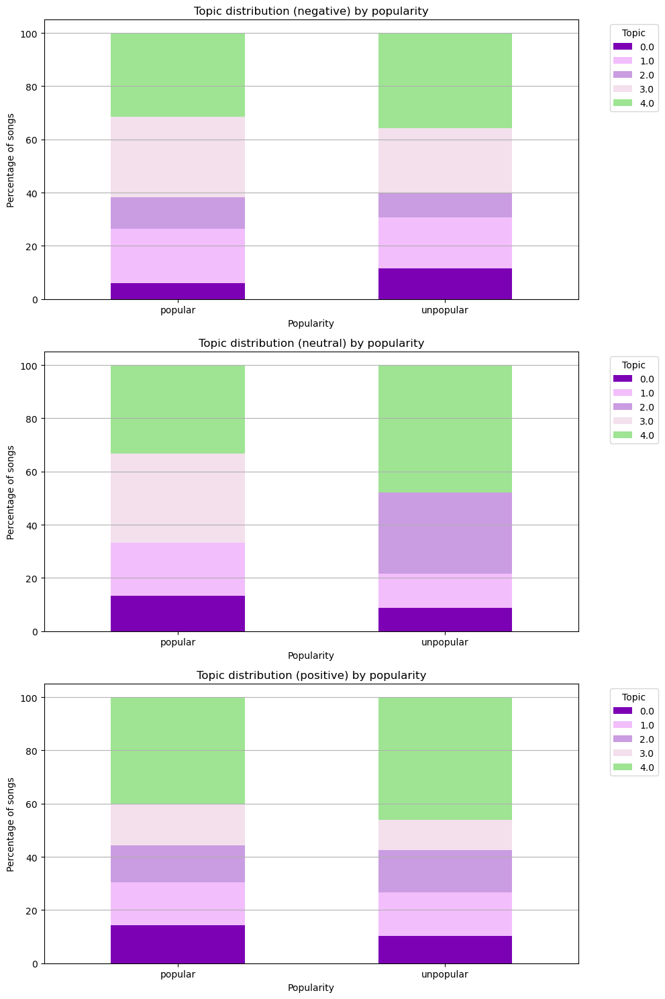

In [31]:
## Topics by popularity within each sentiment (subplots)
grouped = df_all_lyrics.groupby(["sentiment", "popularity", "topic"]).size().unstack(fill_value=0)
sentiments = grouped.index.levels[0]

fig, axes = plt.subplots(nrows=len(sentiments), figsize=(10, 5 * len(sentiments)))

if len(sentiments) == 1:
    axes = [axes]

for ax, sentiment in zip(axes, sentiments):
    data = grouped.loc[sentiment]
    data_percent = data.div(data.sum(axis=1), axis=0) * 100
    data_percent.plot(kind="bar", stacked=True, ax=ax, color=paleta)
    ax.set_title(f"Topic distribution ({sentiment}) by popularity")
    ax.set_xlabel("Popularity")
    ax.set_ylabel("Percentage of songs")
    ax.legend(title="Topic", bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
    ax.grid(axis="y")

plt.tight_layout()
plt.show()

## Word Frequency y Bigrams

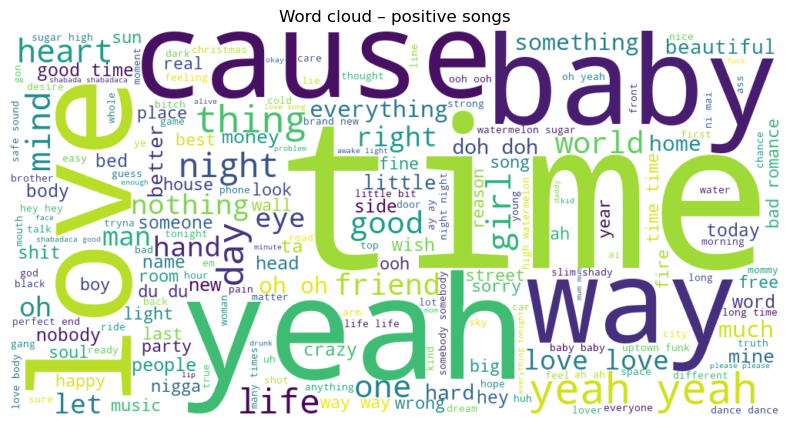

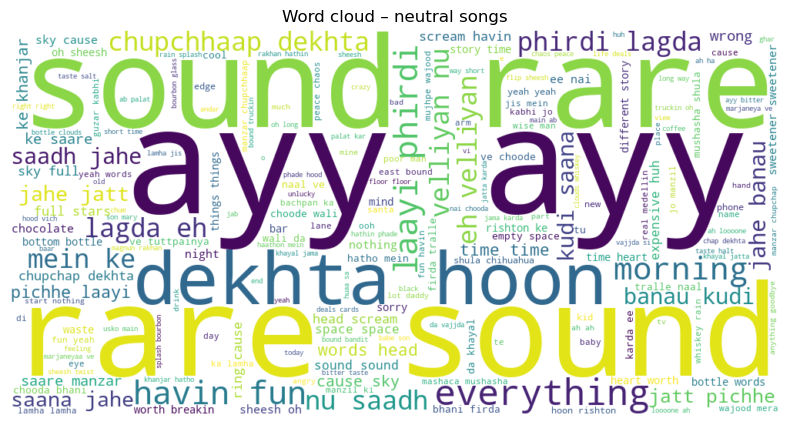

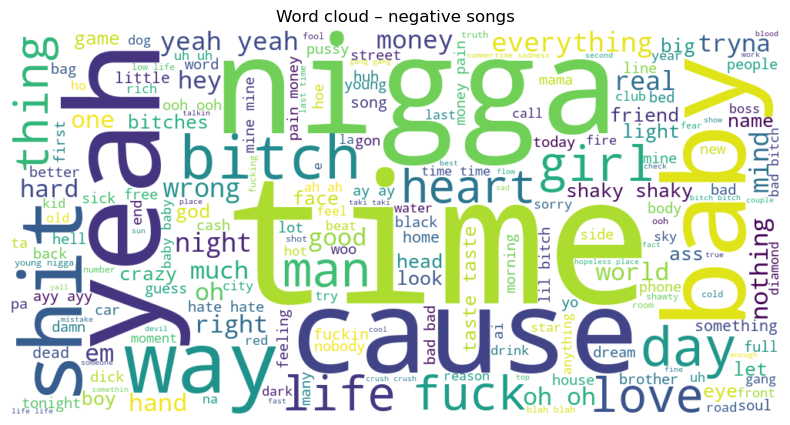

In [33]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# ------------------------------
# 1. Word clouds by sentiment
# ------------------------------

for sentimiento in ["positive", "neutral", "negative"]:
    subset = df_all_lyrics[df_all_lyrics["sentiment"] == sentimiento]
    # text = " ".join(subset["cleaned_text"])
    text = " ".join(subset["filtered_text"])
    
    wordcloud = WordCloud(width=1000, height=500, background_color="white").generate(text)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word cloud – {sentimiento} songs")
    plt.show()

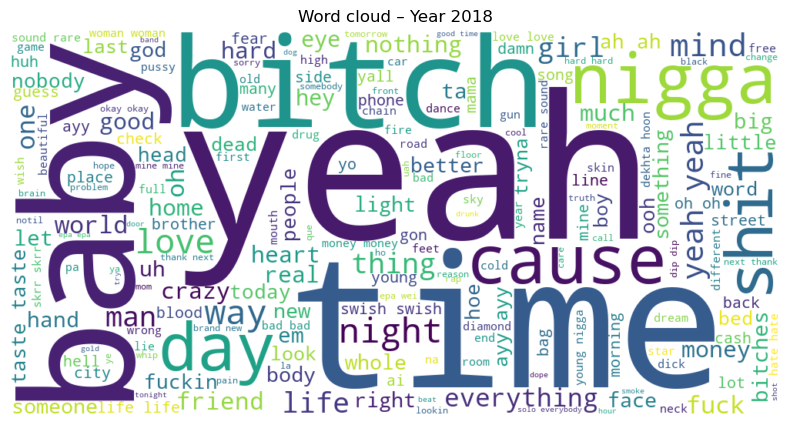

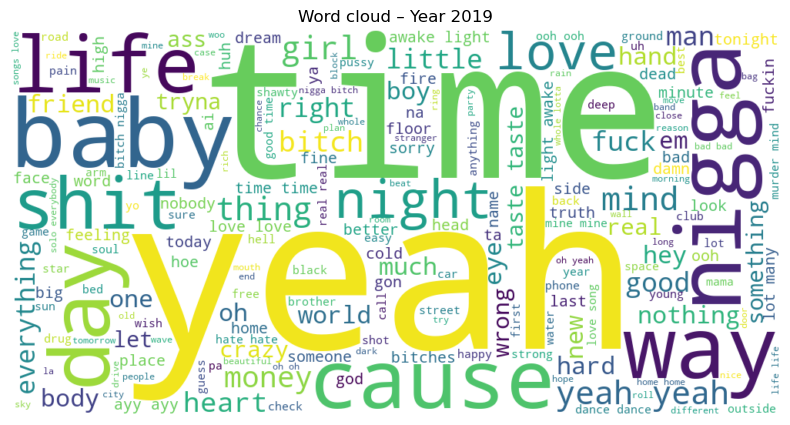

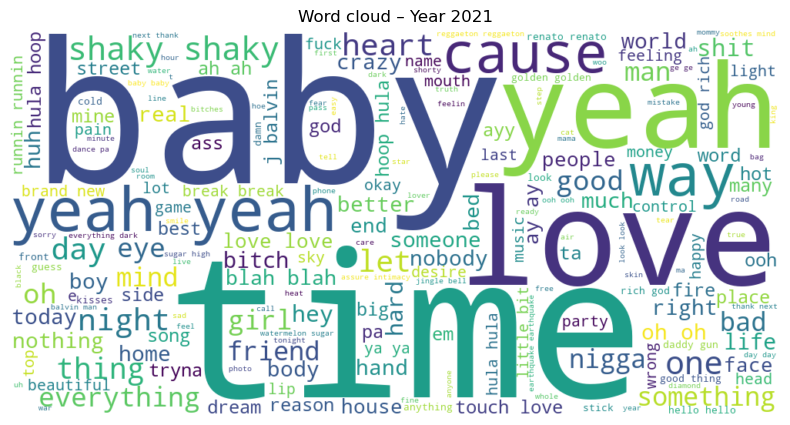

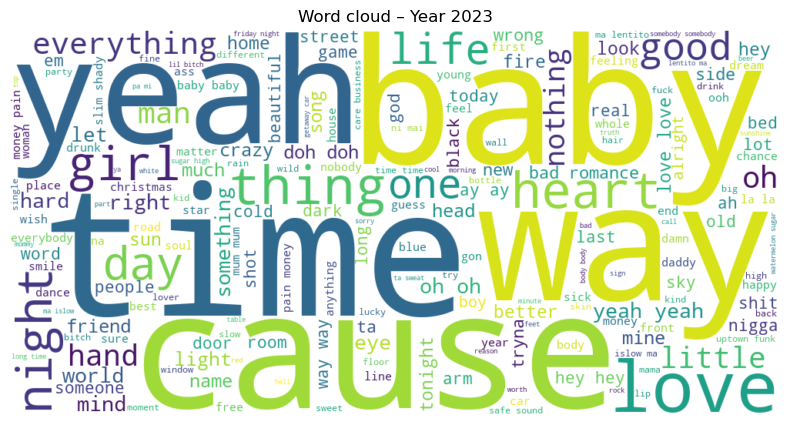

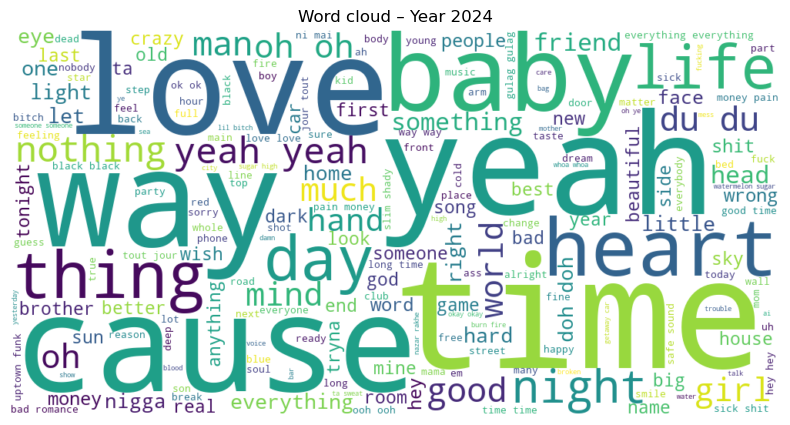

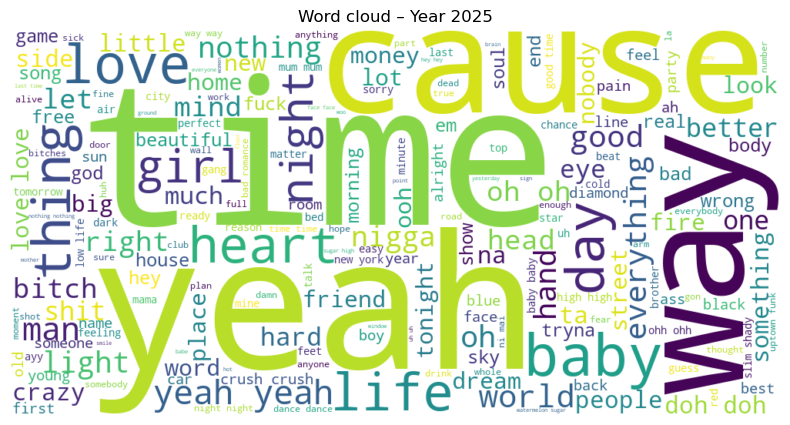

In [35]:
# ------------------------------
# 2. Word clouds by year
# ------------------------------

for year in sorted(df_all_lyrics["year_query"].dropna().unique()):
    subset = df_all_lyrics[df_all_lyrics["year_query"] == year]
    text = " ".join(subset["filtered_text"])
    
    if not text.strip():
        continue

    wordcloud = WordCloud(width=1000, height=500, background_color="white").generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word cloud – Year {int(year)}")
    plt.show()

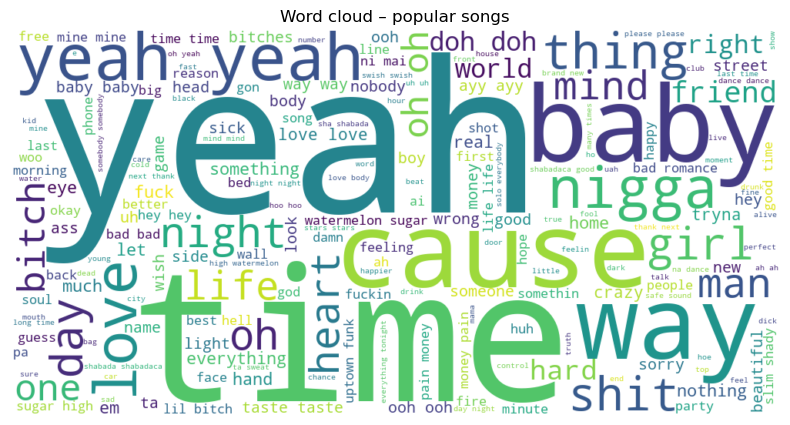

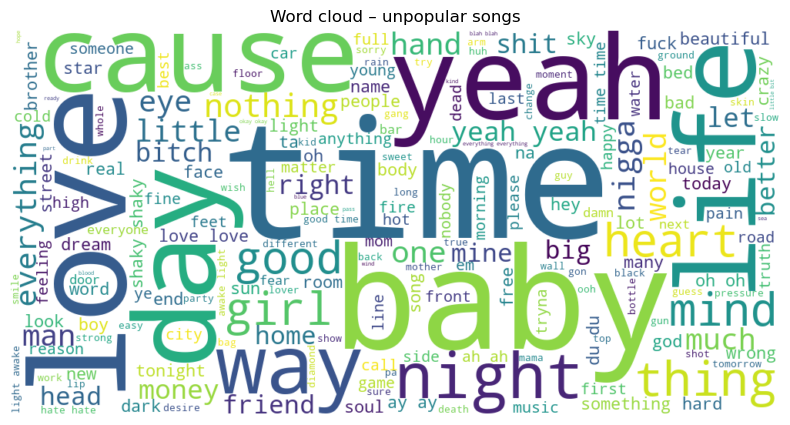

In [37]:
# ------------------------------
# 3. Word clouds by popularity
# ------------------------------
for cat in ["popular", "unpopular"]:
    subset = df_all_lyrics[df_all_lyrics["popularity"] == cat]
    text = " ".join(subset["filtered_text"])
    
    if not text.strip():
        continue

    wordcloud = WordCloud(width=1000, height=500, background_color="white").generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word cloud – {cat} songs")
    plt.show()

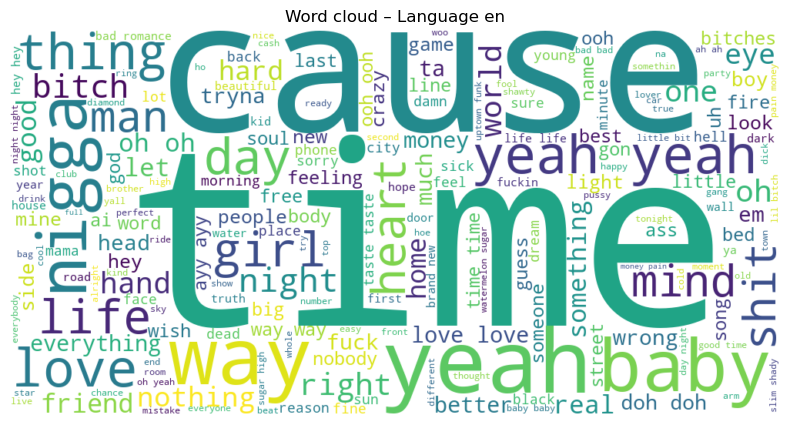

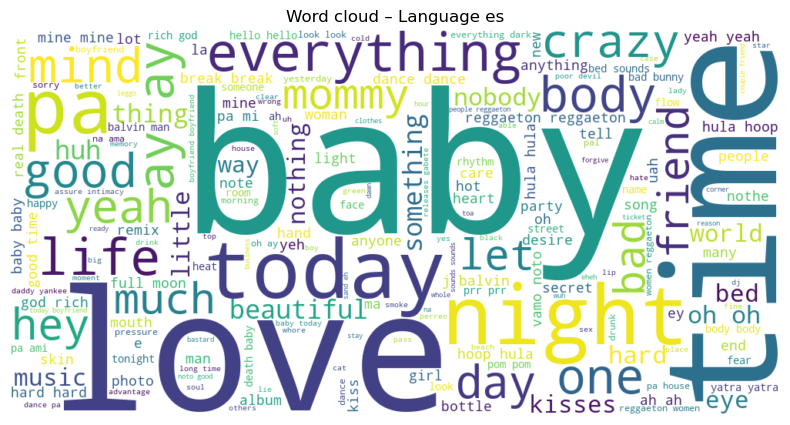

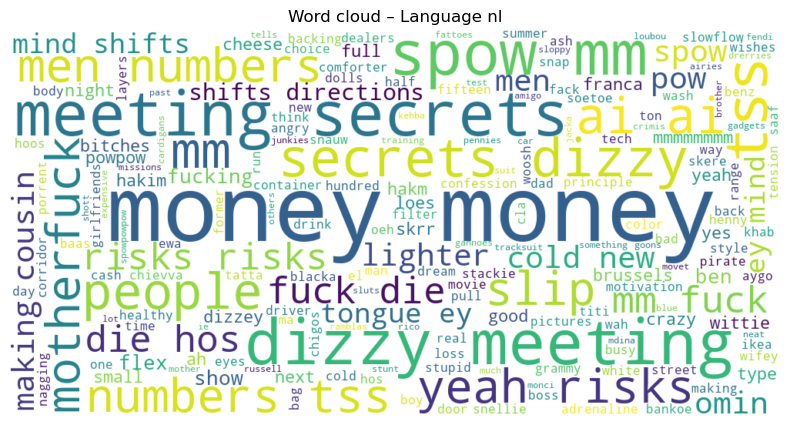

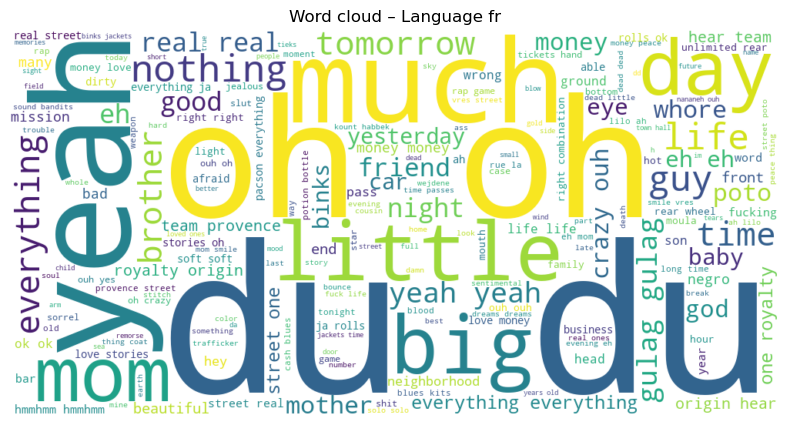

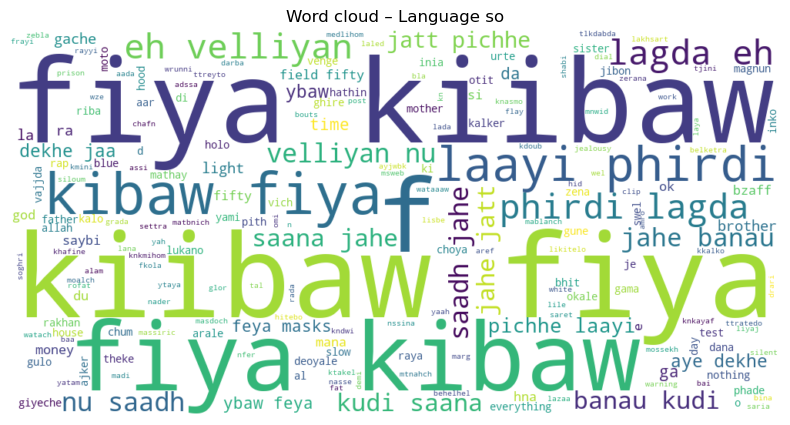

...

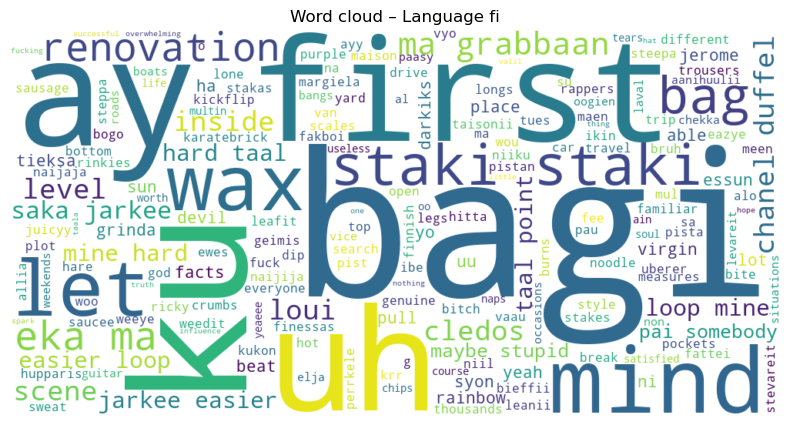

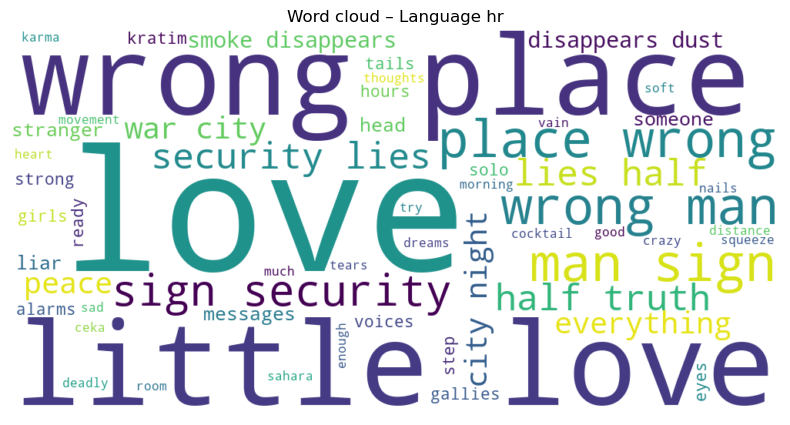

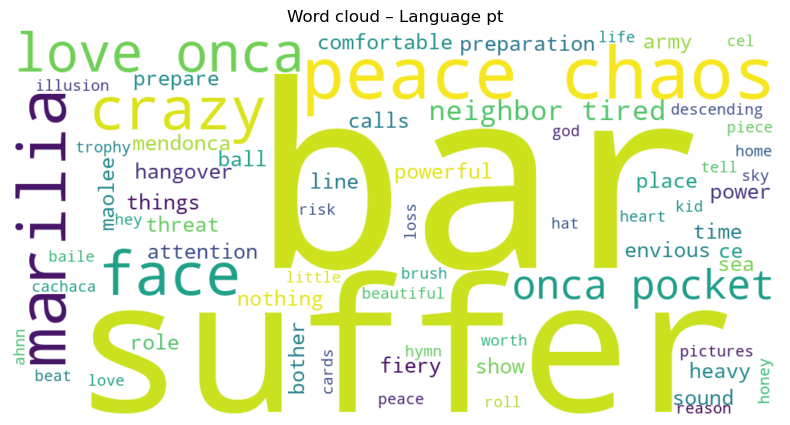

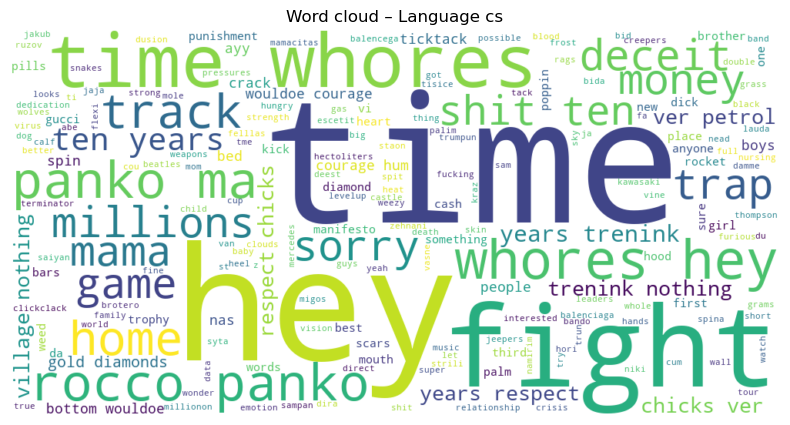

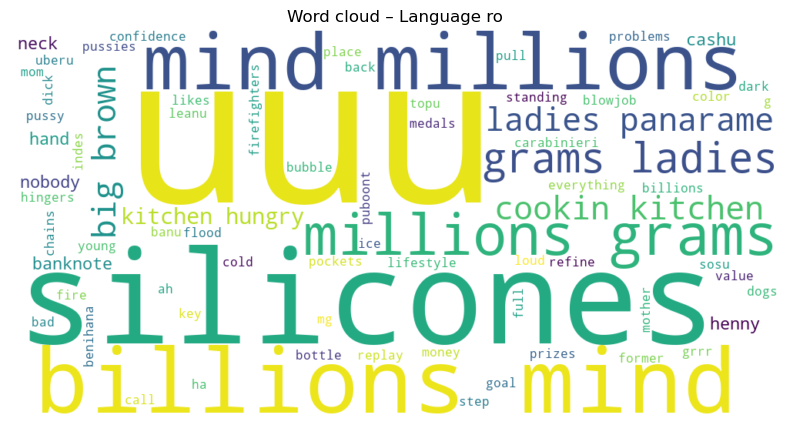

In [39]:
# ------------------------------
# 4. Word clouds by language
# ------------------------------
for lang in df_all_lyrics["lang"].dropna().unique():
    subset = df_all_lyrics[df_all_lyrics["lang"] == lang]
    text = " ".join(subset["filtered_text"])

    if not text.strip():
        continue

    wordcloud = WordCloud(width=1000, height=500, background_color="white").generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word cloud – Language {lang}")
    plt.show()